In [68]:
import sys
sys.path.append('../')
from streetstudy.model import yolo
from sort.sort import *

import cv2 as cv
import numpy as np
import PIL
import matplotlib.pyplot as plt

In [3]:
model = yolo.yolov5()

Using cache found in /home/sardarchitect/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2023-6-3 Python-3.11.3 torch-2.0.1 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


In [4]:
video_path = '/home/sardarchitect/datasets/virat/videos/VIRAT_S_010204_03_000606_000632.mp4'
annotations_df = yolo.predict_video(model, video_path, is_df=True)
annotations_df.head()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [00:06<00:00, 59.01it/s]


,current_frame,bbox_center_x,bbox_center_y,bbox_width,bbox_height,conf,class
0,0.0,653.130432,408.532349,39.914185,115.512878,0.820346,0.0
1,0.0,882.397705,574.228210,60.084473,168.106323,0.812304,0.0
2,0.0,239.157959,274.765991,19.790527,43.392822,0.719700,0.0
3,0.0,162.950714,278.693115,21.694214,52.959167,0.657319,0.0
4,0.0,320.193359,260.543213,23.525024,54.572876,0.520432,0.0


[[     308.43      233.26      331.96      287.83        1577]
 [      152.1      252.21       173.8      305.17        1576]
 [     229.26      253.07      249.05      296.46        1575]
 [     852.36      490.18      912.44      658.28        1574]
 [     633.17      350.78      673.09      466.29        1573]]
[[     312.43      240.29      330.95      288.36        1577]
 [     153.05      252.97      175.25       307.2        1576]
 [     230.15      252.54      249.72      293.61        1575]
 [     856.74      488.68      915.73      658.61        1574]
 [     632.41       351.5      674.32      469.42        1573]]
[[     309.66      235.24      330.38      287.21        1577]
 [     153.94      253.81       175.5      305.81        1576]
 [     230.97      251.34      249.08      285.38        1575]
 [     858.55      489.46      917.15      658.52        1574]
 [     632.35      351.19      674.94      470.38        1573]]
[[     308.69      234.19      330.28      287.13   

KeyboardInterrupt: 

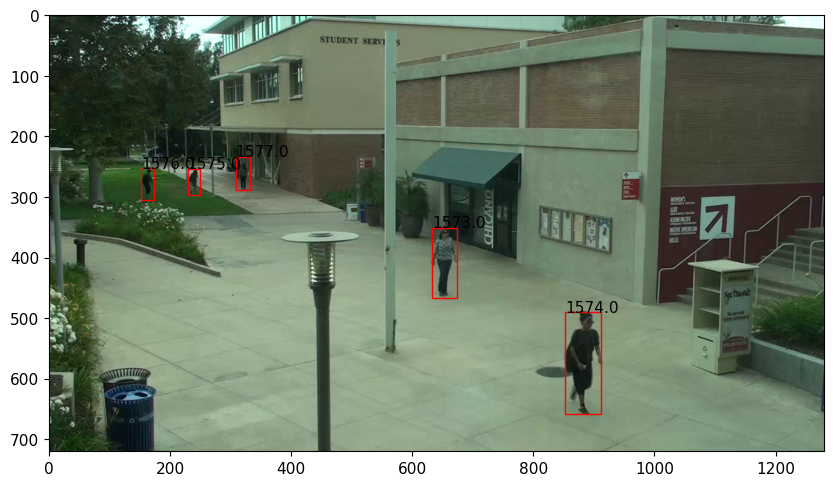

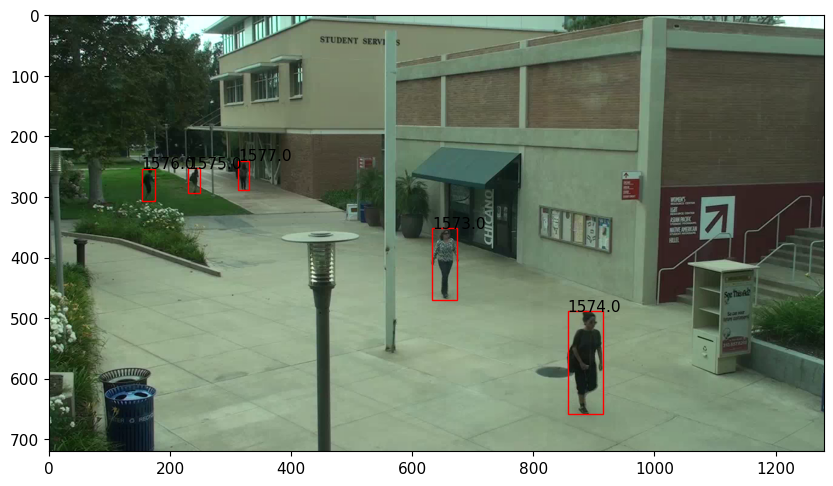

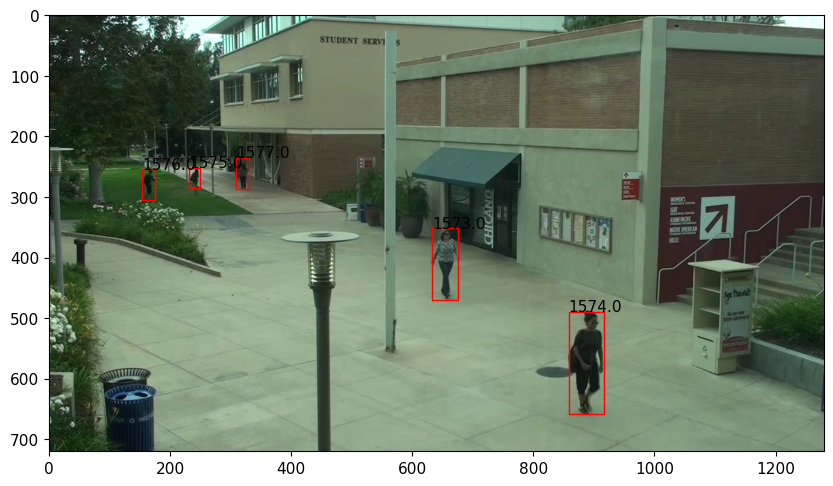

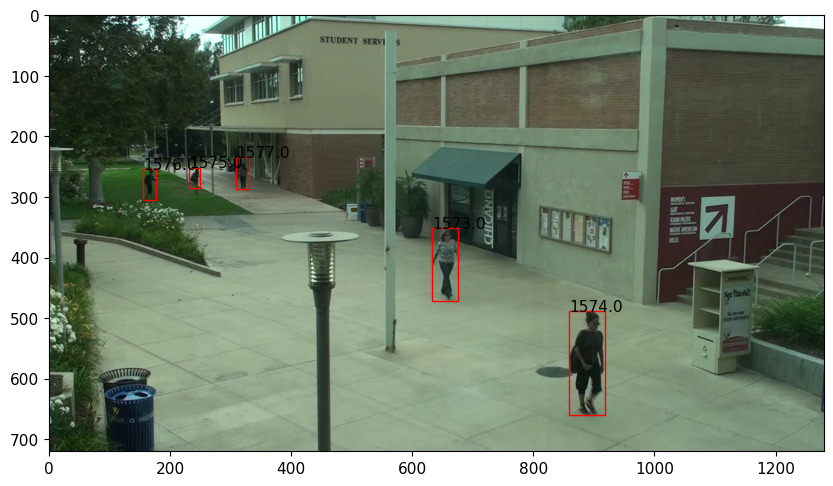

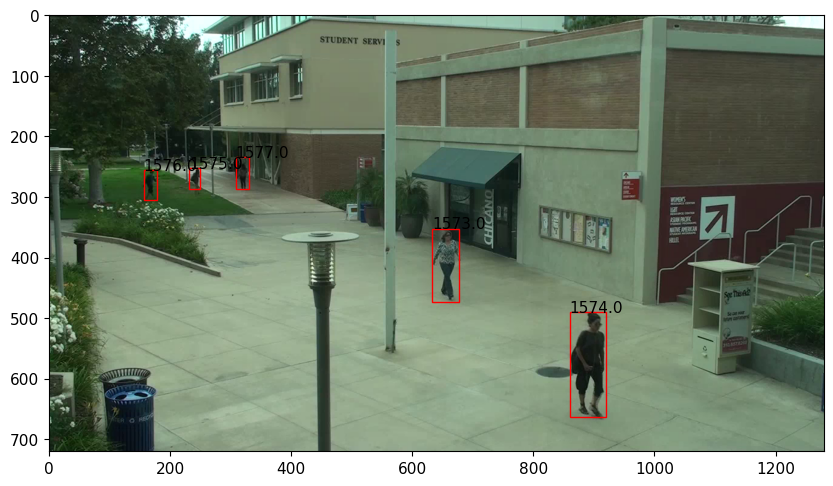

...

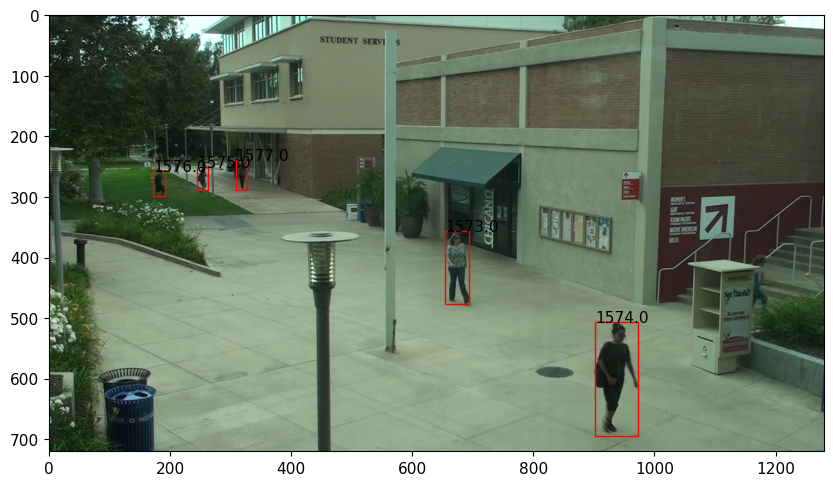

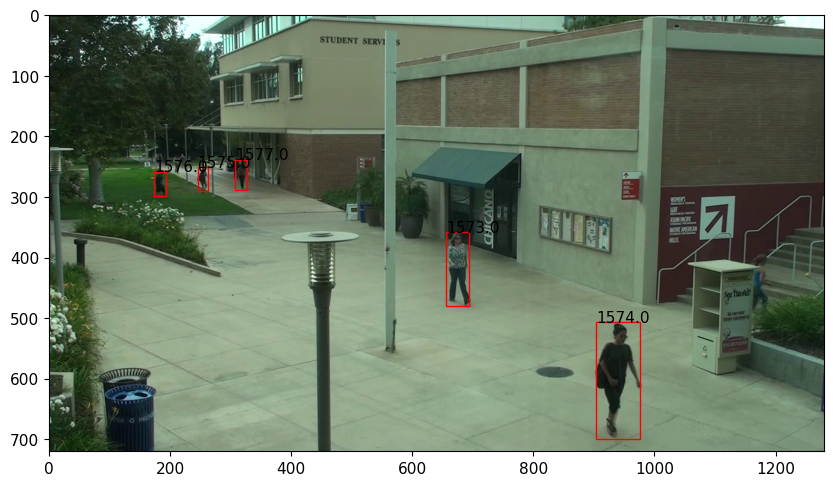

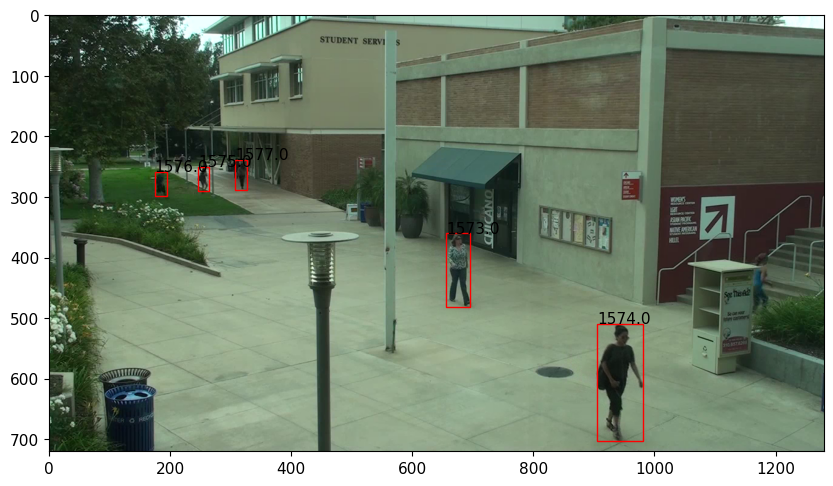

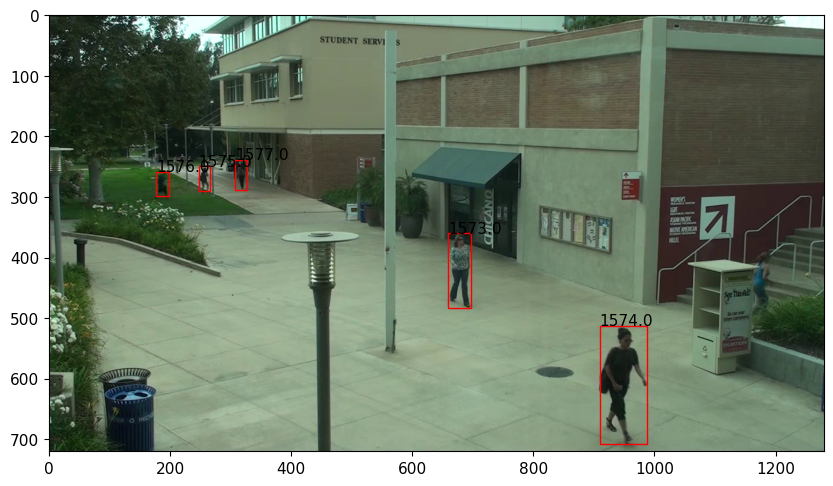

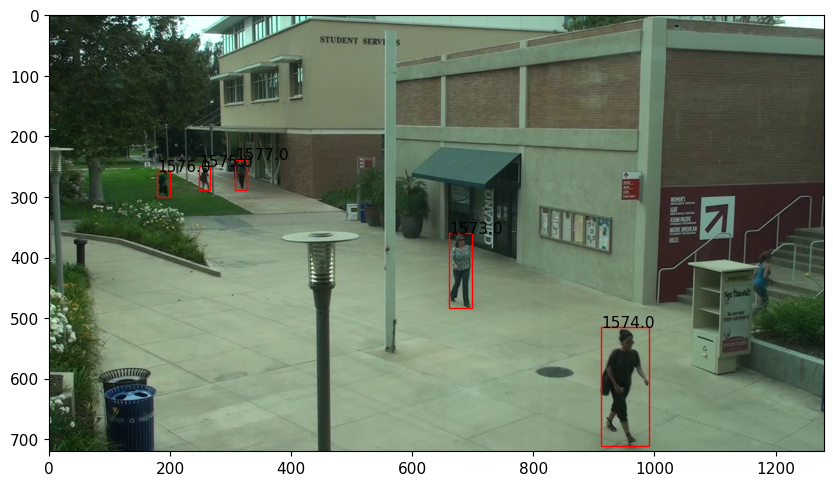

In [86]:
%matplotlib inline
capture = cv.VideoCapture(video_path)
fps = capture.get(cv.CAP_PROP_FPS)
length = int(capture.get(cv.CAP_PROP_FRAME_COUNT))
image_height = int(capture.get(cv.CAP_PROP_FRAME_HEIGHT))
image_width = int(capture.get(cv.CAP_PROP_FRAME_WIDTH))
sort = Sort(max_age=1, min_hits=3, iou_threshold=0.3)

while True:
    current_frame_number = int(capture.get(cv.CAP_PROP_POS_FRAMES))
    success, frame = capture.read()
    if not success:
        break
    preds = model(frame)
    preds = preds.xyxy[0]
    dets = preds[:, :4]
    res = sort.update(dets.cpu().numpy())
    print(res)
    
    fig, ax = plt.subplots(figsize=(10,7))
    ax.set(xlim=(0, image_width), ylim=(image_height, 0))
    for bbox in res:
        ax.add_patch(
            matplotlib.patches.Rectangle(
                (bbox[0], bbox[1]), 
                bbox[2] - bbox[0], 
                bbox[3] - bbox[1], 
                rotation_point='xy',
                facecolor='none', 
                ec='r', 
                lw=1)
        )
        plt.text(bbox[0], bbox[1], bbox[4])
    ax.imshow(cv.cvtColor(frame, cv.COLOR_BGR2RGB))
    
    if not os.path.exists('outputs'):
        os.mkdir('outputs')
    fig.savefig(f'./outputs/{current_frame_number}')
    
capture.release()